## Bonus round fine-tuning
We used the models created in the development phase on the new data (Final_Dataset). We froze 10 layers of out models and trained on the new data with a low learning rate to incorporate the information from the new images.


# Initialization

Import libraries and define variables.

In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import os
import tensorflow as tf
import numpy as np
import time
import PIL
from PIL import ImageOps
from matplotlib import cm
import matplotlib.pyplot as plt

%matplotlib inline

# Set the seed for random operations. 
# This let our experiments to be reproducible. 
SEED = 1234
tf.random.set_seed(SEED)
np.random.seed(SEED)

cwd = os.getcwd()

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
batch_size = 8
img_h = 512
img_w = 512
perform_holdout_validation = True

In [ ]:
#https://drive.google.com/file/d/1vBlEqpFhZpqUdF3Zex8Y1JDUTybWcw9Q/view?usp=sharing
!unzip '/content/drive/MyDrive/an2dl homework2/Final_Dataset.zip'

Image data generators

In [ ]:
# ImageDataGenerator
# ------------------

from tensorflow.keras.preprocessing.image import ImageDataGenerator

apply_data_augmentation = True

# Create training ImageDataGenerator object
# We need two different generators for images and corresponding masks
if apply_data_augmentation:
    img_data_gen = ImageDataGenerator(rotation_range=10,
                                      width_shift_range=10,
                                      height_shift_range=10,
                                      zoom_range=0.3,
                                      horizontal_flip=True,
                                      vertical_flip=False,
                                      fill_mode='reflect')
    mask_data_gen = ImageDataGenerator(rotation_range=10,
                                       width_shift_range=10,
                                       height_shift_range=10,
                                       zoom_range=0.3,
                                       horizontal_flip=True,
                                       vertical_flip=False,
                                       fill_mode='reflect')

# Create validation and test ImageDataGenerator objects
if perform_holdout_validation:
  valid_img_data_gen = ImageDataGenerator(rescale=1./255)
  valid_mask_data_gen = ImageDataGenerator()
test_img_data_gen = ImageDataGenerator(rescale=1./255)
test_mask_data_gen = ImageDataGenerator()

Convert RGB mask into target mask (taken from starting_kit, but modified to use an image instead of image_path)

In [ ]:
# Convert RGB mask into target mask
from PIL import Image
def read_rgb_mask(image):
    '''
    image: mask image
    Returns the numpy array containing target values
    '''

    mask_img = image
    mask_arr = np.array(mask_img)

    new_mask_arr = np.zeros(mask_arr.shape[:2])#, dtype=mask_arr.dtype)

    colors_dict = {}
    colors_dict[0] = [254, 124, 18]#[216, 124, 18]
    colors_dict[1] = [255, 255, 255]#[255, 255, 255]
    colors_dict[2] = [216, 67, 82]#[216, 67, 82]

    # Use RGB dictionary in 'RGBtoTarget.txt' to convert RGB to target
    new_mask_arr[np.where(np.all(mask_arr == colors_dict[0], axis=-1))] = 0
    new_mask_arr[np.where(np.all(mask_arr == colors_dict[1], axis=-1))] = 1
    new_mask_arr[np.where(np.all(mask_arr == colors_dict[2], axis=-1))] = 2#np.where(np.all(mask_arr == colors_dict[2], axis=-1))

    return new_mask_arr

Custom dataset that creates both training and validation set

In [ ]:
from PIL import Image
class CustomDataset(tf.keras.utils.Sequence):

#   """
#     CustomDataset inheriting from tf.keras.utils.Sequence.

#     3 main methods:
#       - __init__: save dataset params like directory, filenames..
#       - __len__: return the total number of samples in the dataset
#       - __getitem__: return a sample from the dataset

#     Note: 
#       - the custom dataset return a single sample from the dataset. Then, we use 
#         a tf.data.Dataset object to group samples into batches.
#   """
  
  def __init__(self, dataset_dir, which_subset, img_generator=None, mask_generator=None, 
               preprocessing_function=None, out_shape=[img_w, img_h]):
    validation_split = 0.2
    subset_filenames = []
    subset_filenames_haricot = os.listdir(os.path.join(dataset_dir, 'Haricot', 'Images'))
    subset_filenames_mais = os.listdir(os.path.join(dataset_dir, 'Mais', 'Images'))
    subset_filenames.extend(subset_filenames_haricot)
    subset_filenames.extend(subset_filenames_mais)

    subset_directories = []
    for i in range(len(subset_filenames_haricot)):
      subset_directories.append('Haricot')
    for i in range(len(subset_filenames_mais)):
      subset_directories.append('Mais')

    # Remove filename extension.
    extension = subset_filenames[0][-4:]
    for i in range(len(subset_filenames)):
      subset_filenames[i] = subset_filenames[i][0:-4]

    # Shuffle both filenames and directories, since we are using the same seed they will be shuffled in the same way.
    tf.random.shuffle(subset_filenames, seed = SEED)
    tf.random.shuffle(subset_directories, seed = SEED)

    if perform_holdout_validation:
      if (which_subset == 'training'):
        subset_filenames = subset_filenames[0:int((1-validation_split)*len(subset_filenames))]
        subset_directories = subset_directories[0:int((1-validation_split)*len(subset_directories))]
      elif (which_subset == 'validation'):
        subset_filenames = subset_filenames[-int(validation_split*len(subset_filenames)):len(subset_filenames)]
        subset_directories = subset_directories[-int(validation_split*len(subset_directories)):len(subset_directories)]
    self.extension = extension
    self.which_subset = which_subset
    self.dataset_dir = dataset_dir
    self.subset_filenames = subset_filenames
    self.subset_directories = subset_directories
    self.img_generator = img_generator
    self.mask_generator = mask_generator
    self.preprocessing_function = preprocessing_function
    self.out_shape = out_shape

  def __len__(self):
    return len(self.subset_filenames)

  def __getitem__(self, index):
    # Read Image
    curr_filename = self.subset_filenames[index]
    curr_directory = self.subset_directories[index]
    team_name = curr_filename.split('_')[0]
    img = Image.open(os.path.join(self.dataset_dir, curr_directory, 'Images', curr_filename + self.extension))
    mask = Image.open(os.path.join(self.dataset_dir, curr_directory, 'Masks', curr_filename + '.png'))

    # # Resize image and mask
    # img = img.resize(self.out_shape)
    # mask = mask.resize(self.out_shape, resample=Image.NEAREST)
    
    img_arr = np.array(img)
    mask_arr = np.array(mask)
    # mask_arr = read_rgb_mask(mask)

    if self.which_subset == 'training':
      if self.img_generator is not None and self.mask_generator is not None:
        # Perform data augmentation
        # We can get a random transformation from the ImageDataGenerator using get_random_transform
        # and we can apply it to the image using apply_transform
        img_t = self.img_generator.get_random_transform(self.out_shape)#, seed=SEED
        # mask_t = self.mask_generator.get_random_transform(self.out_shape, seed=SEED)
        img_arr = self.img_generator.apply_transform(img_arr, img_t)
        mask_arr = self.img_generator.apply_transform(mask_arr, img_t)

    mask_tr_arr = Image.fromarray(mask_arr)
    mask_arr = read_rgb_mask(mask_tr_arr)
    mask_arr = np.expand_dims(mask_arr, -1)

    return img_arr, np.float32(mask_arr)

Custom dataset that creates the test set

In [ ]:
from PIL import Image

#the difference with respect to CustomDataset is the return type of get item, we adapted it in order to simplify the creation of the submission file
class CustomTestDataset(tf.keras.utils.Sequence):

  def __init__(self, dataset_dir, which_subset, img_generator=None, mask_generator=None, 
               preprocessing_function=None, out_shape=[img_w, img_h]):

    subset_filenames = []
    subset_filenames = os.listdir(os.path.join(dataset_dir, 'Images'))
    for i in range(len(subset_filenames)):
      subset_filenames[i] = subset_filenames[i][0:-4]

    self.which_subset = which_subset
    self.dataset_dir = dataset_dir
    self.subset_filenames = subset_filenames
    self.img_generator = img_generator
    self.mask_generator = mask_generator
    self.preprocessing_function = preprocessing_function
    self.out_shape = out_shape

  def __len__(self):
    return len(self.subset_filenames)

  def __getitem__(self, index):
    # Read Image
    curr_filename = self.subset_filenames[index]
    team_name = curr_filename.split('_')[0]
    img = Image.open(os.path.join(self.dataset_dir, 'Images', curr_filename + '.png'))

    # Resize image and mask
    img = img.resize(self.out_shape)
    
    img_arr = np.array(img)

    return img_arr, curr_filename

# Image tiling
* step1: shatter training images and masks, put them in directories called 'Images' and 'Masks'
* step2: create data generator by passing the dir containing 'Images' and 'Masks' to custom dataset
* step3: train the model

In [ ]:
#take as input an image array and the desired tile shape and return the image with padding such that its dimensions are an integer multiple of the tile dimension
def adapt_image(img_array, tile_shape):
  img_shape = img_array.shape
  if (img_shape[0] // tile_shape[0] * tile_shape[0] != img_shape[0] or img_shape[1] // tile_shape[1] * tile_shape[1] != img_shape[1]):
    new_shape = [tile_shape[0] * (img_shape[0] // tile_shape[0] + 1), tile_shape[1] * (img_shape[1] // tile_shape[1] + 1), 3]
    new_img_array = np.zeros(new_shape)
    new_img_array[0:img_shape[0],
                  0:img_shape[1], 
                  ...] = img_array[...]
    # img = Image.fromarray(np.uint8(new_img_array))
    print('adapted from ', img_shape, ' to ', new_shape)
    # plt.imshow(img)
    # print(new_img_array.shape)
    return new_img_array
  print('image does not require adapting')
  return img_array

adapted from  (819, 1228, 3)  to  [1024, 1536, 3]


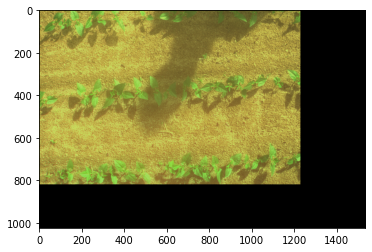

In [ ]:
img = np.array(Image.open('/content/Development_Dataset/Training/Roseau/Haricot/Images/Roseau_haricot_0008_false.png'))
adapted = adapt_image(img, [img_h, img_w])
plt.imshow(np.uint8(adapted))

In [ ]:
#take images from a directory and cut them in pieces of tile shape and put them in the destination directory, images will be adapted (adapt_image) to tile shape in order to not lose any part of it
def shatter_images(source_dir, destination_dir, tile_shape, tile_file_extension):
  
  destination_dir_list = destination_dir.split('/')
  dir = destination_dir_list[0]
  try:
   os.mkdir(dir)
   print(dir + ' created')
  except:
    print(dir+' detected')
  for i in range(1, len(destination_dir_list)):
    dir = dir + '/' + destination_dir_list[i]
    try:
      os.mkdir(dir)
      print(dir + ' created')
    except:
      print(dir+' detected')
  for image_name in os.listdir(source_dir):
    print('shattering ' + image_name)
    image_path = os.path.join(source_dir, image_name)
    image = Image.open(image_path)
    image_array = np.array(image)
    image_array = adapt_image(image_array, tile_shape)
    for height_index in range(int(image_array.shape[0]/tile_shape[0])):
      for width_index in range(int(image_array.shape[1]/tile_shape[1])):
        new_tile_array = image_array[height_index * tile_shape[0] : (height_index + 1) * tile_shape[0],
                                    width_index * tile_shape[1] : (width_index + 1) * tile_shape[1],
                                    ...]
        new_tile_image = Image.fromarray(np.uint8(new_tile_array))
        tile_name = os.path.join(destination_dir, image_name[0:-4] + '_' + str(height_index) + '_' + str(width_index) + tile_file_extension)
        if (tile_file_extension == '.png'):
          try:
            fp = open(tile_name, 'xb')
          except:
            fp = open(tile_name, 'wb')
        else:
          try:
            fp = open(tile_name, 'x')
          except:
            fp = open(tile_name, 'w')
        new_tile_image.save(fp)

#take image tiles and put them together to reconstruct full size image using the names of the images to reconstruct
def stitch_images(original_image_dir, tile_dir, destination_dir, tile_shape, file_extension):
  destination_dir_list = destination_dir.split('/')
  dir = destination_dir_list[0]
  try:
   os.mkdir(dir)
   print(dir + ' created')
  except:
    print(dir+' detected')
  for i in range(1, len(destination_dir_list)):
    dir = dir + '/' + destination_dir_list[i]
    try:
      os.mkdir(dir)
      print(dir + ' created')
    except:
      print(dir+' detected')
      
  for image_name in os.listdir(original_image_dir):
    print('reconstructing ' + image_name)
    image = Image.open(os.path.join(original_image_dir, image_name))
    image_array = np.array(image)
    tiles = []
    image_split = image_name[0:-4].split('_')
    
    print('following shape: ',image_array.shape)
    reconstructed_image = np.zeros_like(image_array)
    adatped_reconstruction = adapt_image(reconstructed_image, [img_h, img_w])
    for tile_name in os.listdir(tile_dir):
      tile_split = tile_name.split('_')
      if (tile_split[0:4] == image_split[0:4]):
        tiles.append(tile_name)
        
    for height_index in range(int(adatped_reconstruction.shape[0]/tile_shape[0])):
      for width_index in range(int(adatped_reconstruction.shape[1]/tile_shape[1])):
        fragment = image_name[0:-4] + '_' + str(height_index) + '_' + str(width_index) + file_extension
        adatped_reconstruction[height_index * tile_shape[0] : (height_index + 1) * tile_shape[0],
                                    width_index * tile_shape[1] : (width_index + 1) * tile_shape[1],
                                    ...] = np.array(Image.open(os.path.join(tile_dir, fragment)))

    reconstructed_image = adatped_reconstruction[0:reconstructed_image.shape[0],
                                                 0:reconstructed_image.shape[1]]
    reconstructed_image_ = Image.fromarray(np.uint8(reconstructed_image))
    if (file_extension == '.png'):
      try:
        fp = open(os.path.join(destination_dir, image_name[0:-4]+'.png'), 'xb')
      except:
        fp = open(os.path.join(destination_dir, image_name[0:-4]+'.png'), 'wb')
    else:
      try:
        fp = open(os.path.join(destination_dir, image_name), 'x')
      except:
        fp = open(os.path.join(destination_dir, image_name), 'w')
    reconstructed_image_.save(fp)
    # break

In [ ]:
# To avoid shattering every time it's possible to unzip a file containing images previously shattered.
# https://drive.google.com/file/d/1aLl2I3XNk6MmP9SFAxZMkaOo6ZQiLZX8/view?usp=sharing
!unzip '/content/drive/MyDrive/an2dl homework2/shattered'

In [ ]:
!rm -rf shattered

In [ ]:
training_dir='/content/Development_Dataset/Training/Bipbip/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Bipbip/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Bipbip/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Development_Dataset/Training/Bipbip/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Bipbip/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Bipbip/Mais/Masks', [img_h,img_w], '.png')

training_dir='/content/Development_Dataset/Training/Pead/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Pead/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Pead/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Development_Dataset/Training/Pead/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Pead/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Pead/Mais/Masks', [img_h,img_w], '.png')

training_dir='/content/Development_Dataset/Training/Roseau/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Roseau/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Roseau/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Development_Dataset/Training/Roseau/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Roseau/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Roseau/Mais/Masks', [img_h,img_w], '.png')

training_dir='/content/Development_Dataset/Training/Weedelec/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Weedelec/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Weedelec/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Development_Dataset/Training/Weedelec/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Weedelec/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Weedelec/Mais/Masks', [img_h,img_w], '.png')

In [ ]:
training_dir='/content/Test_Dev/Bipbip/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Bipbip/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Bipbip/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Test_Dev/Bipbip/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Bipbip/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Bipbip/Mais/Masks', [img_h,img_w], '.png')

training_dir='/content/Test_Dev/Pead/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Pead/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Pead/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Test_Dev/Pead/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Pead/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Pead/Mais/Masks', [img_h,img_w], '.png')

training_dir='/content/Test_Dev/Roseau/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Roseau/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Roseau/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Test_Dev/Roseau/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Roseau/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Roseau/Mais/Masks', [img_h,img_w], '.png')

training_dir='/content/Test_Dev/Weedelec/Haricot'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Weedelec/Haricot/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Weedelec/Haricot/Masks', [img_h,img_w], '.png')

training_dir='/content/Test_Dev/Weedelec/Mais'
img_dir = os.path.join(training_dir, 'Images')
msk_dir = os.path.join(training_dir, 'Masks')
shatter_images(img_dir, 'shattered/Weedelec/Mais/Images', [img_h,img_w], '.png')
shatter_images(msk_dir, 'shattered/Weedelec/Mais/Masks', [img_h,img_w], '.png')

shattered created
shattered/Bipbip created
shattered/Bipbip/Haricot created
shattered/Bipbip/Haricot/Images created
shattering Bipbip_haricot_im_02781.jpg
image does not require adapting
shattering Bipbip_haricot_im_00211.jpg
image does not require adapting
shattering Bipbip_haricot_im_02421.jpg
image does not require adapting
shattering Bipbip_haricot_im_01341.jpg
image does not require adapting
shattering Bipbip_haricot_im_06581.jpg
image does not require adapting
shattering Bipbip_haricot_im_07421.jpg
image does not require adapting
shattering Bipbip_haricot_im_07181.jpg
image does not require adapting
shattering Bipbip_haricot_im_03691.jpg
image does not require adapting
shattering Bipbip_haricot_im_07331.jpg
image does not require adapting
shattering Bipbip_haricot_im_00951.jpg
image does not require adapting
shattering Bipbip_haricot_im_02901.jpg
image does not require adapting
shattering Bipbip_haricot_im_02841.jpg
image does not require adapting
shattering Bipbip_haricot_im_067

In [ ]:
!zip -r shattered_roseau shattered_Roseau
!mv shattered_roseau.zip /content/drive/MyDrive/an2dl\ homework2

# Datasets and Generators

In [ ]:
dataset_bipbip = CustomDataset('shattered/Bipbip', 'training', img_generator=img_data_gen, mask_generator=mask_data_gen)
if perform_holdout_validation:
  dataset_valid_bipbip = CustomDataset('shattered/Bipbip', 'validation')

dataset_pead = CustomDataset('shattered/Pead', 'training', img_generator=img_data_gen, mask_generator=mask_data_gen)
if perform_holdout_validation:
  dataset_valid_pead = CustomDataset('shattered/Pead', 'validation')

dataset_roseau = CustomDataset('shattered/Roseau', 'training', img_generator=img_data_gen, mask_generator=mask_data_gen)
if perform_holdout_validation:
  dataset_valid_roseau = CustomDataset('shattered/Roseau', 'validation')

dataset_weedelec = CustomDataset('shattered/Weedelec', 'training', img_generator=img_data_gen, mask_generator=mask_data_gen)
if perform_holdout_validation:
  dataset_valid_weedelec = CustomDataset('shattered/Weedelec', 'validation')

288
72
<class 'numpy.ndarray'>


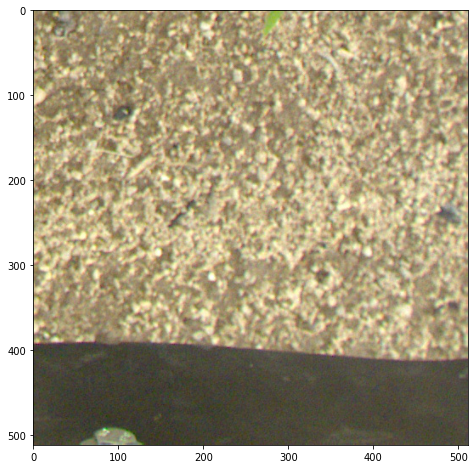

In [ ]:
training_team = 'Bipbip'

if training_team == 'Bipbip':
  dataset = dataset_bipbip
  if perform_holdout_validation:
    dataset_valid = dataset_valid_bipbip
if training_team == 'Pead':
  dataset = dataset_pead
  if perform_holdout_validation:
    dataset_valid = dataset_valid_pead
if training_team == 'Roseau':
  dataset = dataset_roseau
  if perform_holdout_validation:
    dataset_valid = dataset_valid_roseau
if training_team == 'Weedelec':
  dataset = dataset_weedelec
  if perform_holdout_validation:
    dataset_valid = dataset_valid_weedelec

print(len(dataset))
if perform_holdout_validation:
  print(len(dataset_valid))
  for i in dataset_valid:
    print(type(i[0]))
    fig, ax = plt.subplots(1, 1, figsize=(8,8))
    ax.imshow(i[0])
    plt.show()
    break

In [ ]:
train_dataset = tf.data.Dataset.from_generator(lambda: dataset,
                                               output_types=(tf.float32, tf.float32),
                                               output_shapes=([img_h, img_w, 3], [img_h, img_w, 1]))
train_dataset = train_dataset.batch(batch_size)
train_dataset = train_dataset.repeat()

if perform_holdout_validation:
  validation_dataset = tf.data.Dataset.from_generator(lambda: dataset_valid,
                                                output_types=(tf.float32, tf.float32),
                                                output_shapes=([img_h, img_w, 3], [img_h, img_w, 1]))
  validation_dataset = validation_dataset.batch(batch_size)
  validation_dataset = validation_dataset.repeat()

In [ ]:
# Let's test data generator
# -------------------------
select_test = 0 # 0 - train, 1 - validation
if (select_test and perform_holdout_validation):
  iterator = iter(validation_dataset)
else:
  iterator = iter(train_dataset)

(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3) (512, 512) (512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


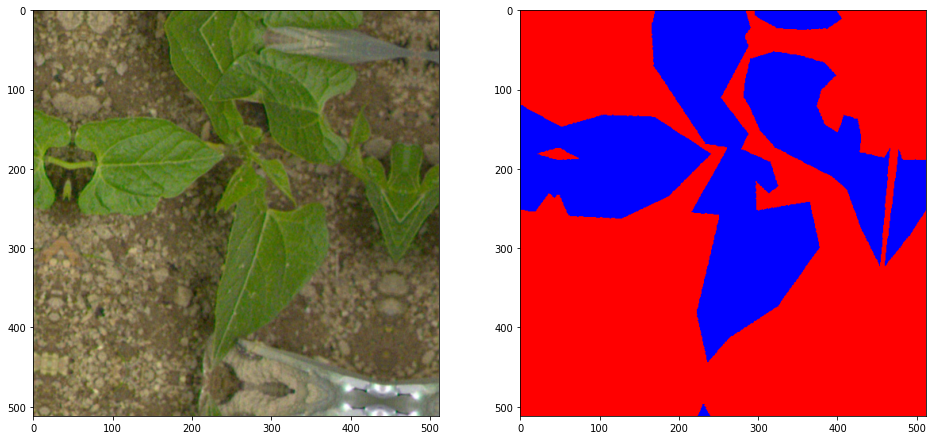

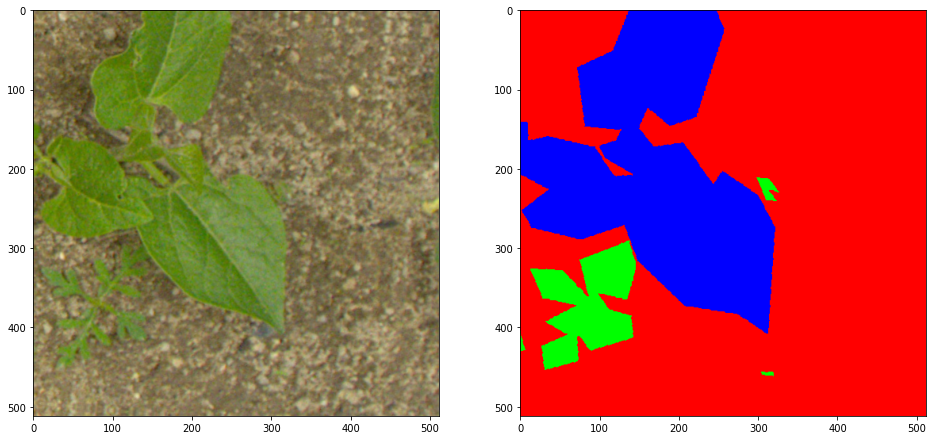

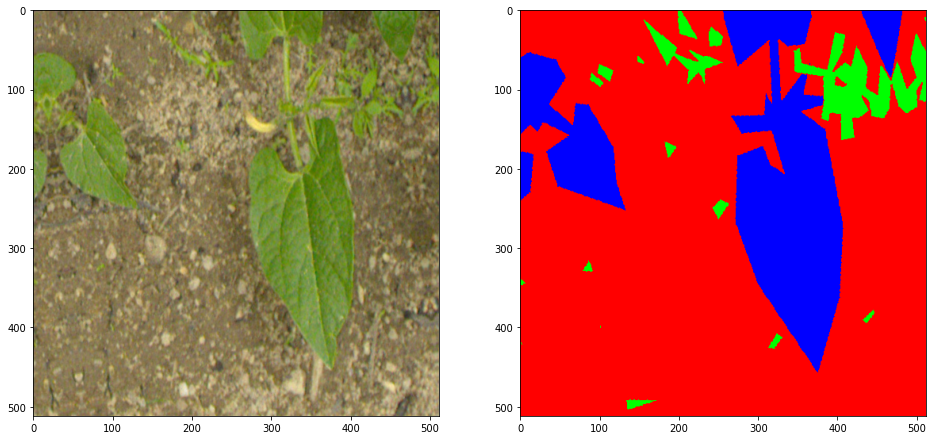

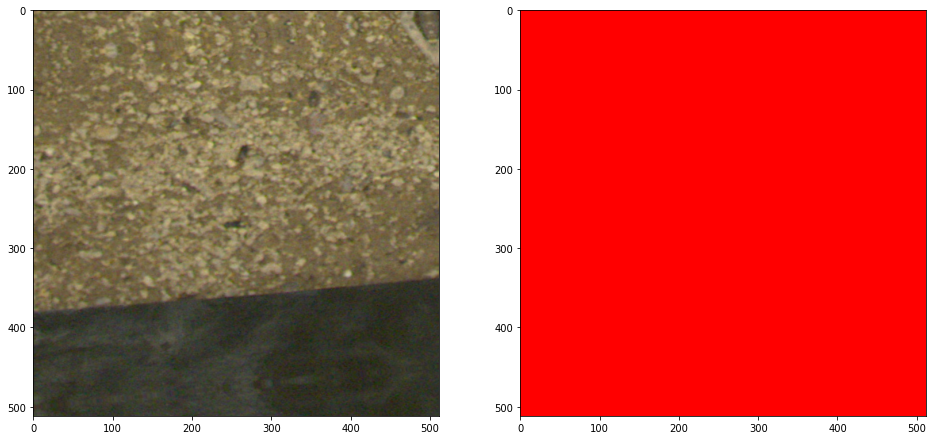

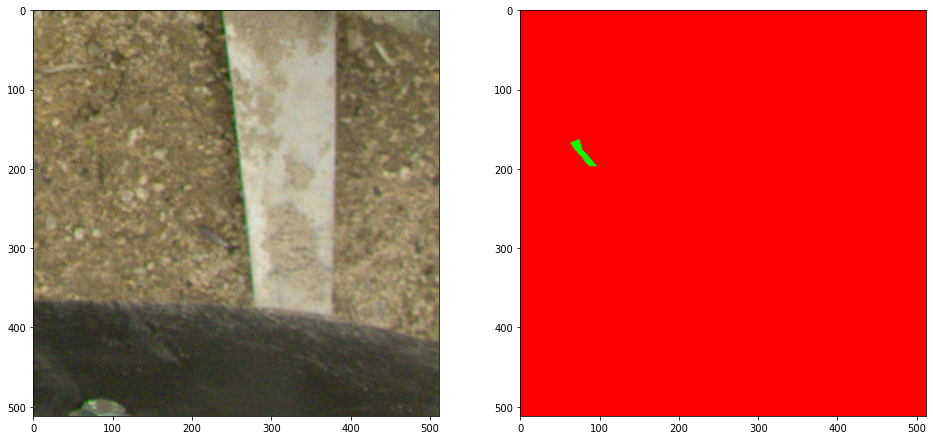

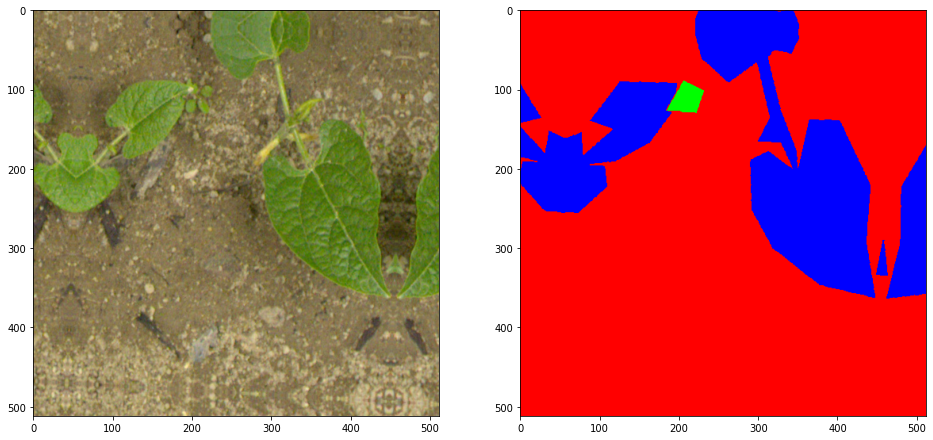

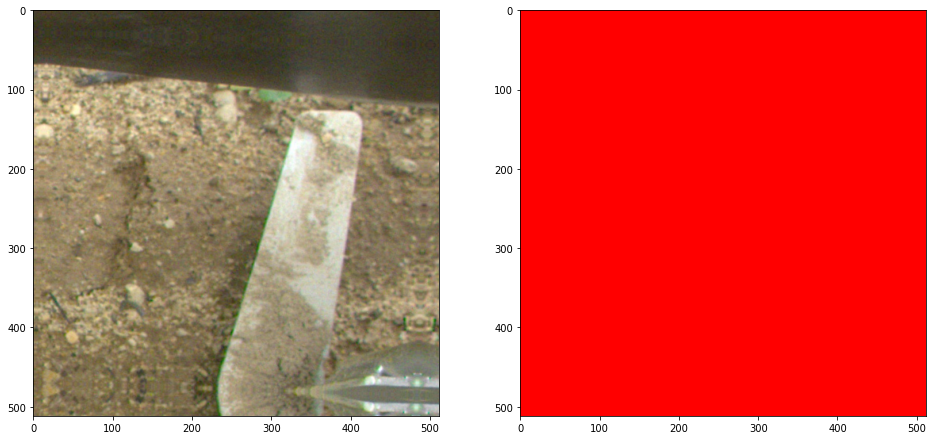

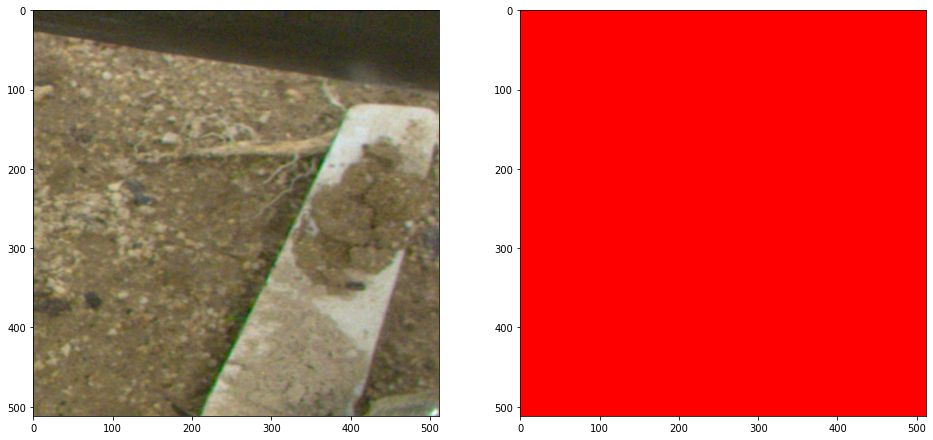

In [ ]:
augmented_img_batch, target_batch = next(iterator)
# print(augmented_img.shape, target.shape)
for index in range(8):
  fig, ax = plt.subplots(1, 2, figsize=(16,16))
  augmented_img = augmented_img_batch[index]
  target = target_batch[index]
  target=np.array(target[..., 0])

  target_img = np.zeros([target.shape[0], target.shape[1], 3])
  print(augmented_img.shape, target.shape, target_img.shape)
  colors_dict = {}
  colors_dict[1] = [0, 0, 255]
  colors_dict[0] = [255, 0, 0]
  colors_dict[2] = [0,255,0]

  target_img[np.where(target == 0)] = colors_dict[0]
  target_img[np.where(target == 1)] = colors_dict[1]
  target_img[np.where(target == 2)] = colors_dict[2]

  ax[0].imshow(np.uint8(augmented_img))
  ax[1].imshow(target_img)
# break

# plt.show()

# UNet model

In [ ]:
num_classes = 3
leakyrelu_alpha = 0.1


# Encoder
# VGG16 architrecture taken from: https://github.com/keras-team/keras-applications/blob/master/keras_applications/vgg16.py
img_input = tf.keras.layers.Input(shape=[img_h, img_w, 3])
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)
down1 = x
x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)
down2 = x
x = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)
down3 = x
x = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)
down4 = x
x = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

# Decoder
x = tf.keras.layers.Conv2D(512, (3, 3), activation=None, padding='same', kernel_initializer = 'he_normal')(x)
x = tf.keras.layers.LeakyReLU(alpha=leakyrelu_alpha)(x)
x = tf.keras.layers.UpSampling2D((2, 2), interpolation='bilinear')(x)
up4 = x
x = tf.keras.layers.concatenate([up4, down4], axis=-1)
x = tf.keras.layers.Conv2D(512, (3, 3), activation=None, padding='same', kernel_initializer = 'he_normal')(x)
x = tf.keras.layers.LeakyReLU(alpha=leakyrelu_alpha)(x)
x = tf.keras.layers.UpSampling2D((2, 2), interpolation='bilinear')(x)
up3 = x
x = tf.keras.layers.concatenate([up3, down3], axis=-1)
x = tf.keras.layers.Conv2D(256, (3, 3), activation=None, padding='same', kernel_initializer = 'he_normal')(x)
x = tf.keras.layers.LeakyReLU(alpha=leakyrelu_alpha)(x)
x = tf.keras.layers.UpSampling2D((2, 2), interpolation='bilinear')(x)
up2 = x
x = tf.keras.layers.concatenate([up2, down2], axis=-1)
x = tf.keras.layers.Conv2D(128, (3, 3), activation=None, padding='same', kernel_initializer = 'he_normal')(x)
x = tf.keras.layers.LeakyReLU(alpha=leakyrelu_alpha)(x)
x = tf.keras.layers.UpSampling2D((2, 2), interpolation='bilinear')(x)
up1 = x
x = tf.keras.layers.concatenate([up1, down1], axis=-1)
x = tf.keras.layers.Conv2D(64, (3, 3), activation=None, padding='same', kernel_initializer = 'he_normal')(x)
x = tf.keras.layers.LeakyReLU(alpha=leakyrelu_alpha)(x)
x = tf.keras.layers.UpSampling2D((2, 2), interpolation='bilinear')(x)
up0 = x
x = tf.keras.layers.Conv2D(32, (3, 3), activation=None, padding='same', kernel_initializer = 'he_normal')(x)
x = tf.keras.layers.LeakyReLU(alpha=leakyrelu_alpha)(x)
x = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(x)

model = tf.keras.Model(img_input, x, name='UNet')

model.load_weights('/content/drive/My Drive/Colab Data/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5', by_name=True) # Weights downloaded from: https://github.com/fchollet/deep-learning-models/releases/download/v0.1/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5

o_shape = model.output_shape
i_shape = model.input_shape
output_height = o_shape[1]
output_width = o_shape[2]
input_height = i_shape[1]
input_width = i_shape[2]
n_classes = o_shape[3]

model.output_width = output_width
model.output_height = output_height
model.n_classes = n_classes
model.input_height = input_height
model.input_width = input_width

model.summary()

Model: "UNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 512, 512, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 512, 512, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 256, 256, 64) 0           block1_conv2[0][0]               
_______________________________________________________________________________________________

# VGG model

In [ ]:
vgg = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_h, img_w, 3))
vgg.summary()
freeze = 10
for layer in vgg.layers[:freeze]:
  layer.trainable = False

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0     

In [ ]:
def create_model(depth, start_f, num_classes):

    model = tf.keras.Sequential()
    
    # Encoder
    # -------
    model.add(vgg)
    
    start_f = 256
        
    # Decoder
    # -------
    for i in range(depth):
        model.add(tf.keras.layers.UpSampling2D(2, interpolation='bilinear'))
        model.add(tf.keras.layers.Conv2D(filters=start_f,
                                         kernel_size=(3, 3),
                                         strides=(1, 1),
                                         padding='same'))
        model.add(tf.keras.layers.ReLU())

        start_f = start_f // 2

    # Prediction Layer
    # ----------------
    model.add(tf.keras.layers.Conv2D(filters=num_classes,
                                     kernel_size=(1, 1),
                                     strides=(1, 1),
                                     padding='same',
                                     activation='softmax'))
    
    return model

In [ ]:
model = create_model(depth=5, 
                     start_f=8, 
                     num_classes=3)
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 8, 8, 512)         14714688  
_________________________________________________________________
up_sampling2d_45 (UpSampling (None, 16, 16, 512)       0         
_________________________________________________________________
conv2d_58 (Conv2D)           (None, 16, 16, 256)       1179904   
_________________________________________________________________
re_lu_25 (ReLU)              (None, 16, 16, 256)       0         
_________________________________________________________________
up_sampling2d_46 (UpSampling (None, 32, 32, 256)       0         
_________________________________________________________________
conv2d_59 (Conv2D)           (None, 32, 32, 128)       295040    
_________________________________________________________________
re_lu_26 (ReLU)              (None, 32, 32, 128)      

# Custom model

In [ ]:
def create_model(depth, start_f, num_classes, dynamic_input_shape):

    model = tf.keras.Sequential()
    
    # Encoder
    # -------
    for i in range(depth):
        
        if i == 0:
            if dynamic_input_shape:
                input_shape = [None, None, 3]
            else:
                input_shape = [img_h, img_w, 3]
        else:
            input_shape=[None]
        
        model.add(tf.keras.layers.Conv2D(filters=start_f, 
                                         kernel_size=(3, 3),
                                         strides=(1, 1),
                                         padding='same',
                                         input_shape=input_shape))
        model.add(tf.keras.layers.ReLU())
        model.add(tf.keras.layers.MaxPool2D(pool_size=(2, 2)))

        start_f *= 2

    # Bottleneck
    model.add(tf.keras.layers.Conv2D(filters=start_f, kernel_size=(3, 3), strides=(1, 1), padding='same'))
    model.add(tf.keras.layers.ReLU())
    
    start_f = start_f // 2
        
    # Decoder
    # -------
    for i in range(depth):
        model.add(tf.keras.layers.UpSampling2D(2, interpolation='bilinear'))
        model.add(tf.keras.layers.Conv2D(filters=start_f,
                                         kernel_size=(3, 3),
                                         strides=(1, 1),
                                         padding='same'))
        model.add(tf.keras.layers.ReLU())

        start_f = start_f // 2

    # Prediction Layer
    # ----------------
    model.add(tf.keras.layers.Conv2D(filters=1,
                                     kernel_size=(1, 1),
                                     strides=(1, 1),
                                     padding='same',
                                     activation='softmax'))
    
    return model

In [ ]:
model = create_model(depth=6, 
                     start_f=8, 
                     num_classes=3,
                     dynamic_input_shape = False)

# Visualize created model as a table
model.summary()

# Visualize initialized weights
# model.weights

# Loaded models

In [ ]:
# !!! define meanIoU before loading models(next cell)

# bipbip https://drive.google.com/drive/folders/11FjG09rCRnB8GG-kk2q86NKaYtfXmDcw?usp=sharing
# pead https://drive.google.com/drive/folders/1-XVpaN2PhGbASryblgclq_-Z53yOoflV?usp=sharing
# roseau https://drive.google.com/drive/folders/12eH7lWTZu1BG08-a3CNk2VfvU6JT0iQu?usp=sharing
# weedelec https://drive.google.com/drive/folders/11BegM1yC0GH8zyD3Iv0qUqyib-mUwDnN?usp=sharing
# model_bipbip = tf.keras.models.load_model('/content/drive/MyDrive/an2dl homework/bipbip_models/bipbip-unet-20epoch+lr6+10epoch+freeze5', custom_objects={'meanIoU': meanIoU})
# model_pead = tf.keras.models.load_model('/content/drive/MyDrive/an2dl homework2/best models/saved_model_homework2_UNet_Pead_tiling_60', custom_objects={'meanIoU': meanIoU})
# model_roseau = tf.keras.models.load_model('/content/drive/MyDrive/an2dl homework2/saved_models/freshRoseauFreeze5train16lr5/ckpts', custom_objects={'meanIoU': meanIoU})
# model_weedelec = tf.keras.models.load_model('/content/drive/MyDrive/an2dl homework2/best models/saved_model_homework2_UNet_Weedelec_tiling_75', custom_objects={'meanIoU': meanIoU})

model_bipbip = tf.keras.models.load_model('/content/drive/MyDrive/Colab Data/acre_model_fine_tuning/bipbip', custom_objects={'meanIoU': meanIoU})
model_pead = tf.keras.models.load_model('/content/drive/MyDrive/Colab Data/acre_model_fine_tuning/saved_model_homework2_UNet_Pead_tiling_X_final', custom_objects={'meanIoU': meanIoU})
model_roseau = tf.keras.models.load_model('/content/drive/MyDrive/Colab Data/acre_model_fine_tuning/roseau', custom_objects={'meanIoU': meanIoU})
model_weedelec = tf.keras.models.load_model('/content/drive/MyDrive/Colab Data/acre_model_fine_tuning/saved_model_homework2_UNet_Weedelec_tiling_X_final', custom_objects={'meanIoU': meanIoU})


In [ ]:
model = model_bipbip

In [ ]:
#unfreeze
unfreeze = 10
for layer in model.layers[unfreeze:]:
  layer.trainable = True
model.summary()

In [ ]:
#freeze
freeze = 10
for layer in model.layers[:freeze]:
  layer.trainable = False
model.summary()

Model: "UNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 512, 512, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 512, 512, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 256, 256, 64) 0           block1_conv2[0][0]               
_______________________________________________________________________________________________

# Model fit

In [ ]:
# Here we define the intersection over union for each class in the batch.
# Then we compute the final iou as the mean over classes
def meanIoU(y_true, y_pred):
  weight_class_1 = 1
  weight_class_2 = 1

  # get predicted class from softmax
  y_pred = tf.expand_dims(tf.argmax(y_pred, -1), -1)

  per_class_iou = []

  for i in range(1, 3): # exclude the background class 0
    # Get prediction and target related to only a single class (i)
    class_pred = tf.cast(tf.where(y_pred == i, 1, 0), tf.float32)
    class_true = tf.cast(tf.where(y_true == i, 1, 0), tf.float32)
    intersection = tf.reduce_sum(class_true * class_pred)
    union = tf.reduce_sum(class_true) + tf.reduce_sum(class_pred) - intersection
  
    iou = (intersection + 1e-7) / (union + 1e-7)
    per_class_iou.append(iou)

  return (per_class_iou[0]*weight_class_1 + per_class_iou[1]*weight_class_2)/(weight_class_1 + weight_class_2)

In [ ]:
def custom_loss(y_true, y_pred):
  return (1-meanIoU(y_true, y_pred))*tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)

In [ ]:
# Optimization params
# -------------------

# Loss
# Sparse Categorical Crossentropy to use integers (mask) instead of one-hot encoded labels
loss = tf.keras.losses.SparseCategoricalCrossentropy() 
# learning rate
lr = 1e-5
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
# -------------------

# Validation metrics
# ------------------
metrics = ['accuracy', meanIoU]
# ------------------

# Compile Model
model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir /content/drive/My\ Drive/Colab\ Data/multiclass_segmentation_experiments/ --port 6009

Reusing TensorBoard on port 6009 (pid 1863), started 0:00:14 ago. (Use '!kill 1863' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
import os
from datetime import datetime

cwd = os.getcwd()

exps_dir = os.path.join(cwd, 'drive/My Drive/Colab Data/', 'multiclass_segmentation_experiments')
if not os.path.exists(exps_dir):
    os.makedirs(exps_dir)

now = datetime.now().strftime('%b%d_%H-%M-%S')

model_name = 'CNN'

exp_dir = os.path.join(exps_dir, model_name + '_' + str(now))
if not os.path.exists(exp_dir):
    os.makedirs(exp_dir)
    
callbacks = []

# Model checkpoint
# ----------------
ckpt_dir = os.path.join(exp_dir, 'ckpts')
if not os.path.exists(ckpt_dir):
    os.makedirs(ckpt_dir)

print("Enabled ModelCheckpoint")
ckpt_callback = tf.keras.callbacks.ModelCheckpoint(filepath=ckpt_dir,
                                                   monitor = 'val_loss', 
                                                   save_weights_only=False,# False to save the model directly
                                                   save_best_only = True)  
callbacks.append(ckpt_callback)

# Visualize Learning on Tensorboard
# ---------------------------------
tb_dir = os.path.join(exp_dir, 'tb_logs')
if not os.path.exists(tb_dir):
    os.makedirs(tb_dir)
    
# By default shows losses and metrics for both training and validation
print("Enabled TensorBoard")
tb_callback = tf.keras.callbacks.TensorBoard(log_dir=tb_dir,
                                             profile_batch=0,
                                             histogram_freq=0)  # if 1 shows weights histograms
callbacks.append(tb_callback)

# Early Stopping
# --------------
early_stop = True
if early_stop and perform_holdout_validation:
  print("Enabled EarlyStopping")
  es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
  callbacks.append(es_callback)

reduce_lr_on_plateau = True
# Reduce learning rate on plateau (if validation loss is constant during training, reduce lr by an order of magnitude).
if reduce_lr_on_plateau and perform_holdout_validation:
  print("Enabled ReduceLROnPlateau")
  rlrp = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_delta=1E-7, verbose=1)
  callbacks.append(rlrp)


Enabled ModelCheckpoint
Enabled TensorBoard
Enabled EarlyStopping
Enabled ReduceLROnPlateau


In [ ]:
perform_holdout_validation=False

In [ ]:
number_of_epochs = 10
if perform_holdout_validation:
  model.fit(x=train_dataset,
            epochs=number_of_epochs,
            steps_per_epoch=len(dataset)/batch_size,
            validation_data=validation_dataset,
            validation_steps=len(dataset_valid)/batch_size, 
            callbacks=callbacks)
else:
  model.fit(x=train_dataset,
            epochs=number_of_epochs,
            steps_per_epoch=len(dataset)/batch_size,
            callbacks=callbacks)

Epoch 1/10
36/36 [==============================] - 115s 3s/step - loss: 0.0535 - accuracy: 0.9802 - meanIoU: 0.6742
Epoch 2/10
36/36 [==============================] - 95s 3s/step - loss: 0.0483 - accuracy: 0.9816 - meanIoU: 0.7010
Epoch 3/10
36/36 [==============================] - 96s 3s/step - loss: 0.0468 - accuracy: 0.9822 - meanIoU: 0.7087
Epoch 4/10
36/36 [==============================] - 95s 3s/step - loss: 0.0456 - accuracy: 0.9827 - meanIoU: 0.7292
Epoch 5/10
36/36 [==============================] - 95s 3s/step - loss: 0.0476 - accuracy: 0.9820 - meanIoU: 0.7117
Epoch 6/10
36/36 [==============================] - 96s 3s/step - loss: 0.0472 - accuracy: 0.9823 - meanIoU: 0.7204
Epoch 7/10
36/36 [==============================] - 96s 3s/step - loss: 0.0448 - accuracy: 0.9831 - meanIoU: 0.7305
Epoch 8/10
36/36 [==============================] - 96s 3s/step - loss: 0.0459 - accuracy: 0.9825 - meanIoU: 0.7322
Epoch 9/10
36/36 [==============================] - 96s 3s/step - loss:

In [ ]:
model.save('/content/drive/MyDrive/Colab Data/acre_model_fine_tuning/bipbip')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Colab Data/acre_model_fine_tuning/bipbip/assets


# Save model

In [ ]:
model.save('/content/drive/MyDrive/Colab Data/saved_model_homework2_UNet_Weedelec_tiling_X_epochs9')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Colab Data/saved_model_homework2_UNet_Weedelec_tiling_X_epochs9/assets


# Test model on shattered validation set

In [ ]:
import time
import matplotlib.pyplot as plt

from PIL import Image

%matplotlib inline

iterator = iter(validation_dataset)

(1, 512, 512, 3)

iou score:  tf.Tensor(4.4732007e-10, shape=(), dtype=float32)  end


(1, 512, 512, 3)

iou score:  tf.Tensor(1.0, shape=(), dtype=float32)  end


(1, 512, 512, 3)

iou score:  tf.Tensor(1.0, shape=(), dtype=float32)  end


(1, 512, 512, 3)

iou score:  tf.Tensor(1.0, shape=(), dtype=float32)  end


(1, 512, 512, 3)

iou score:  tf.Tensor(1.0, shape=(), dtype=float32)  end


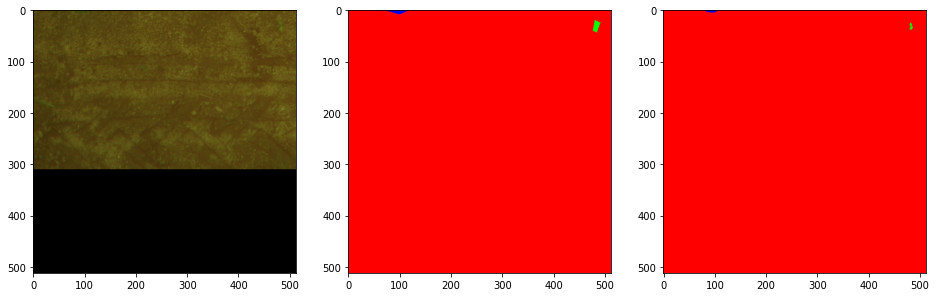

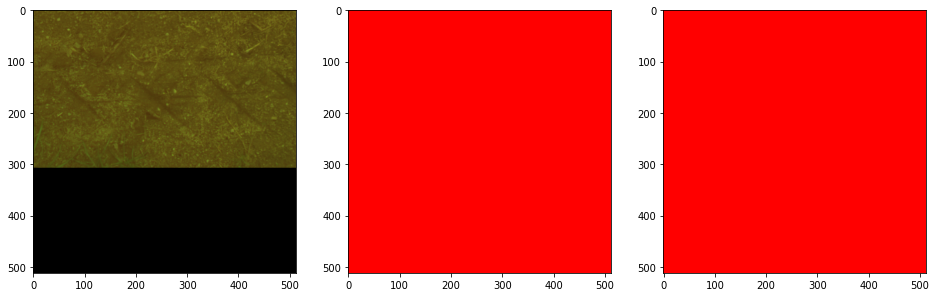

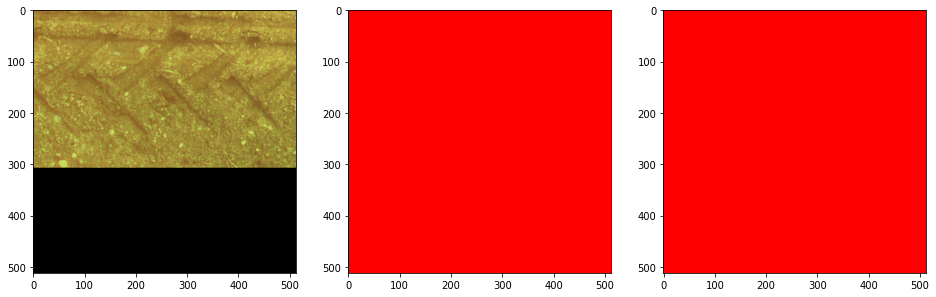

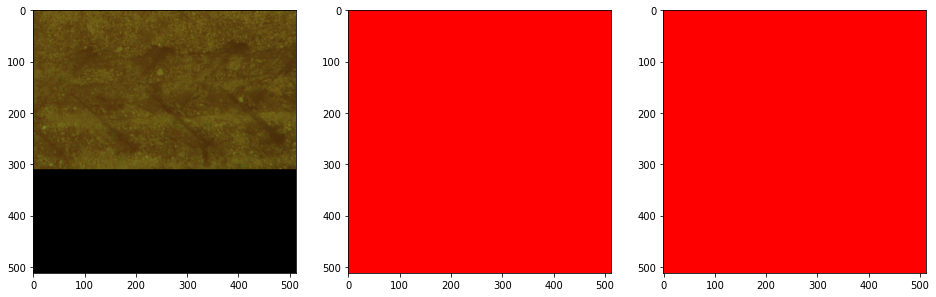

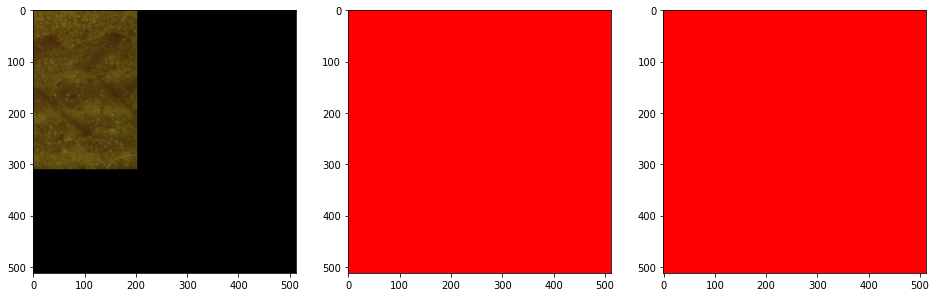

In [ ]:
for i in range(5):
  fig, ax = plt.subplots(1, 3, figsize=(16, 16))
  fig.show()
  image, target = next(iterator)

  image = image[0]
  target = target[0, ..., 0]

  out_sigmoid = model.predict(x=tf.expand_dims(image, 0))

  # Get predicted class as the index corresponding to the maximum value in the vector probability
  predicted_class = tf.argmax(out_sigmoid, -1)

  out_sigmoid.shape

  predicted_class = predicted_class[0, ...]

  iouScore = meanIoU(target, predicted_class)

  # Assign colors (just for visualization)
  target_img = np.zeros([target.shape[0], target.shape[1], 3])
  prediction_img = np.zeros([target.shape[0], target.shape[1], 3])

  colors_dict = {}
  colors_dict[1] = [0, 0, 255]
  colors_dict[0] = [255, 0, 0]
  colors_dict[2] = [0,255,0]

  target_img[np.where(target == 0)] = colors_dict[0]
  target_img[np.where(target == 1)] = colors_dict[1]
  target_img[np.where(target == 2)] = colors_dict[2]

  prediction_img[np.where(predicted_class == 0)] = colors_dict[0]
  prediction_img[np.where(predicted_class == 1)] = colors_dict[1]
  prediction_img[np.where(predicted_class == 2)] = colors_dict[2]

  ax[0].imshow(np.uint8(image))
  ax[1].imshow(np.uint8(target_img))
  ax[2].imshow(np.uint8(prediction_img))
  print('iou score: ', (iouScore),' end')

  fig.canvas.draw()
  # time.sleep(1)

In [ ]:
# with tf.Session() as sess:  print(iouScore.eval()) 
iouScore

<tf.Tensor: shape=(), dtype=float32, numpy=4.4732007e-10>

# Create submission

### Create shatter images of test image

In [ ]:
# https://drive.google.com/file/d/1YRnWrL2QZ1zNDS_onQMAD6tGkaoIsrxT/view?usp=sharing
!unzip '/content/drive/MyDrive/an2dl homework2/shattered_test'

Archive:  /content/drive/MyDrive/an2dl homework2/shattered_test
   creating: shattered_test/
   creating: shattered_test/Pead/
   creating: shattered_test/Pead/Haricot/
   creating: shattered_test/Pead/Haricot/Images/
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00427_i750_3_5.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00631_i750_1_4.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00648_i750_2_5.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00605_i750_2_4.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00704_i750_4_4.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00353_i750_4_0.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00704_i750_4_6.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00239_i750_0_4.png  
  inflating: shattered_test/Pead/Haricot/Images/Pead_haricot_00631_i750_2_6.png  
  inflating: shattered_test/Pead/Haricot/Ima

In [ ]:
shatter_images('/content/Development_Dataset/Test_Dev/Bipbip/Mais/Images', 'shattered_test/Bipbip/Mais/Images', [img_h, img_w], '.png')
shatter_images('/content/Development_Dataset/Test_Dev/Bipbip/Haricot/Images', 'shattered_test/Bipbip/Haricot/Images', [img_h, img_w], '.png')

shatter_images('/content/Development_Dataset/Test_Dev/Pead/Mais/Images', 'shattered_test/Pead/Mais/Images', [img_h, img_w], '.png')
shatter_images('/content/Development_Dataset/Test_Dev/Pead/Haricot/Images', 'shattered_test/Pead/Haricot/Images', [img_h, img_w], '.png')

shatter_images('/content/Development_Dataset/Test_Dev/Roseau/Mais/Images', 'shattered_test/Roseau/Mais/Images', [img_h, img_w], '.png')
shatter_images('/content/Development_Dataset/Test_Dev/Roseau/Haricot/Images', 'shattered_test/Roseau/Haricot/Images', [img_h, img_w], '.png')

shatter_images('/content/Development_Dataset/Test_Dev/Weedelec/Mais/Images', 'shattered_test/Weedelec/Mais/Images', [img_h, img_w], '.png')
shatter_images('/content/Development_Dataset/Test_Dev/Weedelec/Haricot/Images', 'shattered_test/Weedelec/Haricot/Images', [img_h, img_w], '.png')

In [ ]:
shatter_images('Test_Final/Bipbip/Mais/Images', 'shattered_test/Bipbip/Mais/Images', [img_h, img_w], '.png')
shatter_images('Test_Final/Bipbip/Haricot/Images', 'shattered_test/Bipbip/Haricot/Images', [img_h, img_w], '.png')

shatter_images('Test_Final/Pead/Mais/Images', 'shattered_test/Pead/Mais/Images', [img_h, img_w], '.png')
shatter_images('Test_Final/Pead/Haricot/Images', 'shattered_test/Pead/Haricot/Images', [img_h, img_w], '.png')

shatter_images('Test_Final/Roseau/Mais/Images', 'shattered_test/Roseau/Mais/Images', [img_h, img_w], '.png')
shatter_images('Test_Final/Roseau/Haricot/Images', 'shattered_test/Roseau/Haricot/Images', [img_h, img_w], '.png')

shatter_images('Test_Final/Weedelec/Mais/Images', 'shattered_test/Weedelec/Mais/Images', [img_h, img_w], '.png')
shatter_images('Test_Final/Weedelec/Haricot/Images', 'shattered_test/Weedelec/Haricot/Images', [img_h, img_w], '.png')

shattered_test created
shattered_test/Bipbip created
shattered_test/Bipbip/Mais created
shattered_test/Bipbip/Mais/Images created
shattering Bipbip_mais_im_04191.jpg
image does not require adapting
shattering Bipbip_mais_im_01811.jpg
image does not require adapting
shattering Bipbip_mais_im_09391.jpg
image does not require adapting
shattering Bipbip_mais_im_04441.jpg
image does not require adapting
shattering Bipbip_mais_im_02841.jpg
image does not require adapting
shattering Bipbip_mais_im_02331.jpg
image does not require adapting
shattering Bipbip_mais_im_10521.jpg
image does not require adapting
shattering Bipbip_mais_im_02601.jpg
image does not require adapting
shattering Bipbip_mais_im_08891.jpg
image does not require adapting
shattering Bipbip_mais_im_08961.jpg
image does not require adapting
shattering Bipbip_mais_im_03461.jpg
image does not require adapting
shattering Bipbip_mais_im_05111.jpg
image does not require adapting
shattering Bipbip_mais_im_01611.jpg
image does not req

### Test model on shattered test set

In [ ]:
test_dir = 'shattered_test/' + training_team + '/Haricot'

In [ ]:
test_dataset = CustomTestDataset(test_dir, 'training', img_generator=img_data_gen, mask_generator=mask_data_gen)
  
test = tf.data.Dataset.from_generator(lambda: test_dataset,
                                              output_types=(tf.float32, tf.float32),
                                              output_shapes=([img_h, img_w, 3], [img_h, img_w, 1]))

test = test.batch(16)

In [ ]:
test_iterator = iter(test_dataset)

'Bipbip_haricot_im_07241_2_1'

(512, 512, 3)

'Bipbip_haricot_im_05671_0_2'

(512, 512, 3)

'Bipbip_haricot_im_03911_2_3'

(512, 512, 3)

'Bipbip_haricot_im_02971_0_2'

(512, 512, 3)

'Bipbip_haricot_im_00251_0_1'

(512, 512, 3)

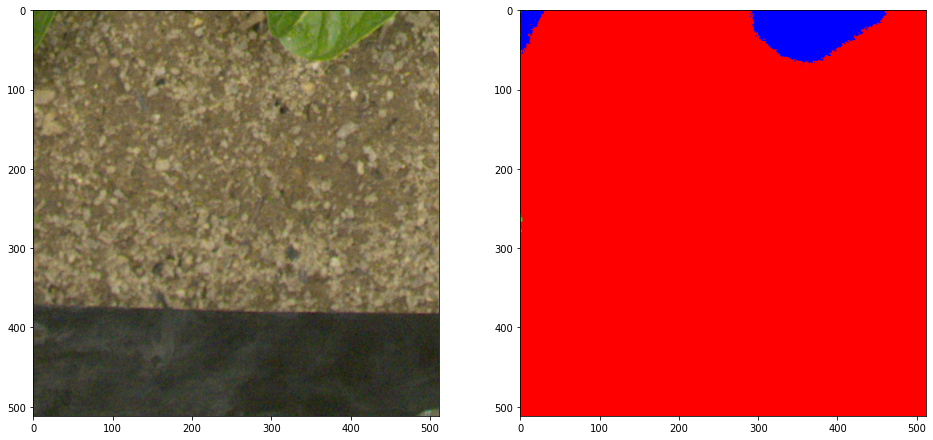

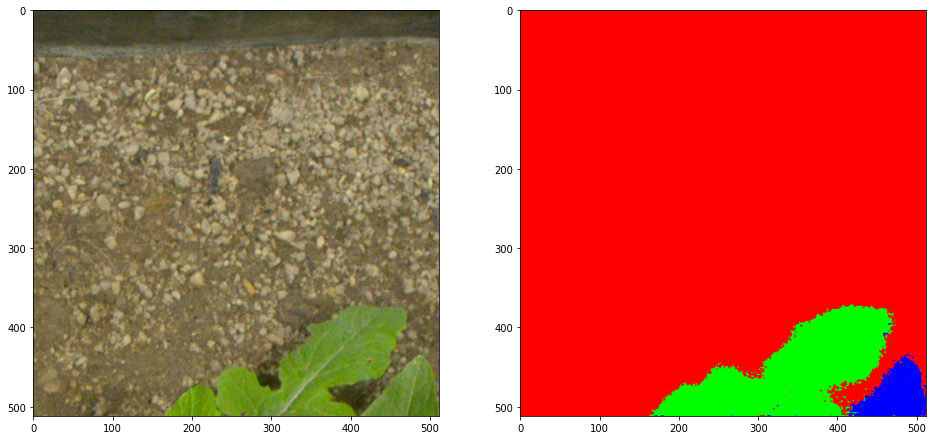

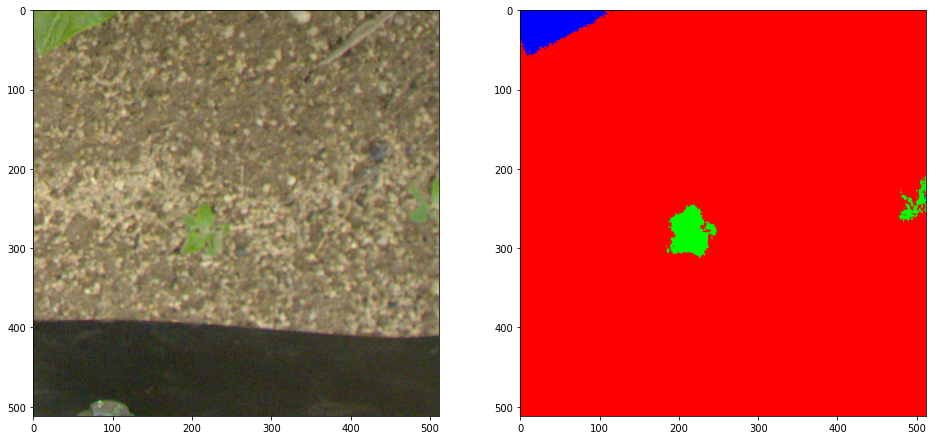

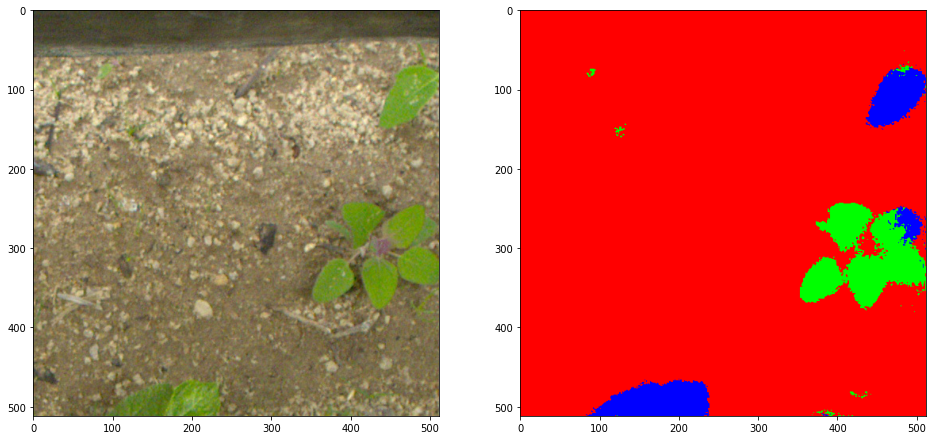

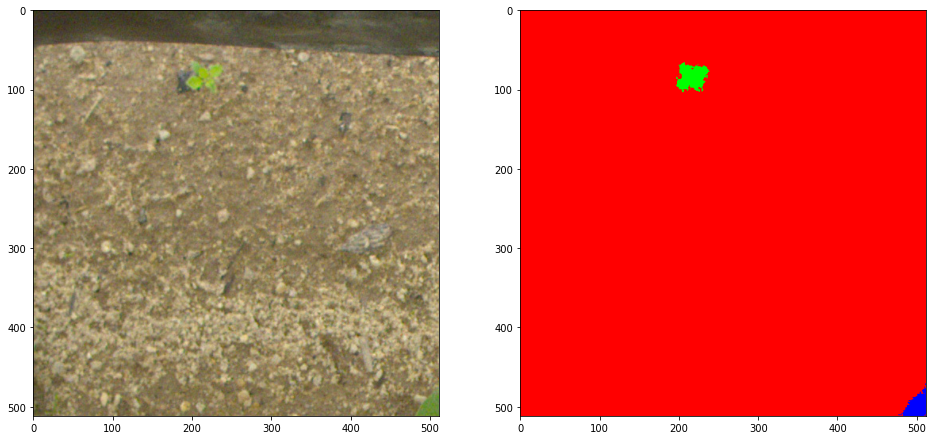

In [ ]:
for i in range(5):
  fig, ax = plt.subplots(1, 2, figsize=(16,16))
  fig.show()

  image = next(test_iterator)
  image[1]
  image = image[0]
  out_sigmoid = model.predict(x=tf.expand_dims(image, 0))
  # out_sigmoid.shape
  predicted_class = tf.argmax(out_sigmoid, -1)
  predicted_class = predicted_class[0, ...]

  colors_dict = {}
  colors_dict[1] = [0, 0, 255]
  colors_dict[0] = [255, 0, 0]
  colors_dict[2] = [0,255,0]

  prediction_img = np.zeros([image.shape[0], image.shape[1], 3])
  prediction_img.shape
  prediction_img[np.where(predicted_class == 0)] = colors_dict[0]
  prediction_img[np.where(predicted_class == 2)] = colors_dict[2]
  prediction_img[np.where(predicted_class == 1)] = colors_dict[1]
  # prediction_img_big = Image.fromarray(np.uint8(prediction_img))
  # prediction_img_big = prediction_img_big.resize([2048, 1536], resample=Image.NEAREST)
  ax[0].imshow(np.uint8(image))
  # ax[1].imshow(prediction_img_big)
  ax[1].imshow(np.uint8(prediction_img))

  fig.canvas.draw()
  # break

### Create predictions on the shattered test images

In [ ]:
def rle_encode(img):
    '''
    img: numpy array, 1 - foreground, 0 - background
    Returns run length as string formatted
    '''
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [ ]:
# Set to True to use model_bipbip, model_pead, model_roseau and model_weedelec.
# While if False it uses model.
# make predictions on test set tiles, save predictions as images
# execution time 7 minutes for entire dataset
use_multiple_models = True

test_dir = '/content/shattered_test'
if (not os.path.exists('shattered_predictions')):
  os.mkdir('shattered_predictions')
  
import string
submission_dict = {}
for i in os.listdir(test_dir):
  # Get correct image size.
  out_image_shape = [1, 1]
  team = i
  if team == 'Bipbip':
    try:
      os.mkdir('shattered_predictions/Bipbip')
      print('shattered_predictions/Bipbip created')
    except:
      print('shattered_predictions/Bipbip detected')
    out_image_shape = [2048, 1536]
  elif team == 'Pead':
    try:
      os.mkdir('shattered_predictions/Pead')
      print('shattered_predictions/Pead created')
    except:
      print('shattered_predictions/Pead detected')
    out_image_shape = [3280, 2464]
  elif team == 'Roseau':
    try:
      os.mkdir('shattered_predictions/Roseau')
      print('shattered_predictions/Roseau created')
    except:
      print('shattered_predictions/Roseau detected')
    out_image_shape = [1228, 819]
  elif team == 'Weedelec':
    try:
      os.mkdir('shattered_predictions/Weedelec')
      print('shattered_predictions/Weedelec created')
    except:
      print('shattered_predictions/Weedelec detected')
    out_image_shape = [5184, 3456]

  print("Creating output for: " + i + " that has image size: " + str(out_image_shape))
  current_team = os.path.join(test_dir, i)
  for j in os.listdir(current_team):
    current_crop = os.path.join(current_team, j)
    try:
      os.mkdir('shattered_predictions/'+team+'/'+j)
      print('shattered_predictions/'+team+'/'+j+' created')
    except:
      print('shattered_predictions/'+team+'/'+j+' detected')
      
    current_test_dataset = CustomTestDataset(current_crop, 'training', img_generator=img_data_gen, mask_generator=mask_data_gen)
    test_iterator = iter(current_test_dataset)

    for i in test_iterator:
      name = i[1]
      image = i
      image = image[0]
      print(image.shape)
      if use_multiple_models:
        if team == 'Bipbip':
          print("Using bipbip model for image " + i[1])
          out_sigmoid = model_bipbip.predict(x=tf.expand_dims(image, 0))
        elif team == 'Pead':
          print("Using pead model for image " + i[1])
          out_sigmoid = model_pead.predict(x=tf.expand_dims(image, 0))
        elif team == 'Roseau':
          print("Using roseau model for image " + i[1])
          out_sigmoid = model_roseau.predict(x=tf.expand_dims(image, 0))
        elif team == 'Weedelec':
          print("Using weedelec model for image " + i[1])
          out_sigmoid = model_weedelec.predict(x=tf.expand_dims(image, 0))
      else:
        print(i[1])
        out_sigmoid = model.predict(x=tf.expand_dims(image, 0))

      predicted_class = tf.argmax(out_sigmoid, -1)
    
      predicted_class = predicted_class[0, ...]

      colors_dict = {}
      colors_dict[0] = [254, 124, 18]#254 124 18
      colors_dict[1] = [255, 255, 255]#255 255 255
      colors_dict[2] = [216,67,82]#216 67 82
      
      prediction_img = np.zeros([image.shape[0], image.shape[1], 3])
      # prediction_img.shape
      prediction_img[np.where(predicted_class == 0)] = colors_dict[0]
      prediction_img[np.where(predicted_class == 1)] = colors_dict[1]
      prediction_img[np.where(predicted_class == 2)] = colors_dict[2]

      extension = '.png'
      try:
        fp = open(os.path.join('shattered_predictions', team, j, name) + extension, 'xb')
      except:
        fp = open(os.path.join('shattered_predictions', team, j, name)+ extension, 'wb')
      prediction_img_ = Image.fromarray(np.uint8(prediction_img))
      # plt.imshow(np.uint8(prediction_img))
      prediction_img_.save(fp)

Output streaming troncato alle ultime 5000 righe.
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T114900-122_5_3
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T115700-307_0_2
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T115526-271_6_10
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T115357-237_2_4
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T114511-34_5_8
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T114511-34_6_0
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T114900-122_1_10
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T114816-105_1_5
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T114547-48_6_9
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-25T120044-394_4_6
(512, 512, 3)
Using weedelec model for image Weedelec_haricot_2019-09-2

### Stitch predictions together

In [ ]:
stitch_images('/content/Development_Dataset/Test_Dev/Bipbip/Mais/Images', '/content/shattered_predictions/Bipbip/Mais', 'stitched_pred/Bipbip/Mais', [img_h, img_w], '.png')
stitch_images('/content/Development_Dataset/Test_Dev/Bipbip/Haricot/Images', '/content/shattered_predictions/Bipbip/Haricot', 'stitched_pred/Bipbip/Haricot', [img_h, img_w], '.png')

stitch_images('/content/Development_Dataset/Test_Dev/Pead/Mais/Images', '/content/shattered_predictions/Pead/Mais', 'stitched_pred/Pead/Mais', [img_h, img_w], '.png')
stitch_images('/content/Development_Dataset/Test_Dev/Pead/Haricot/Images', '/content/shattered_predictions/Pead/Haricot', 'stitched_pred/Pead/Haricot', [img_h, img_w], '.png')

stitch_images('/content/Development_Dataset/Test_Dev/Roseau/Mais/Images', '/content/shattered_predictions/Roseau/Mais', 'stitched_pred/Roseau/Mais', [img_h, img_w], '.png')
stitch_images('/content/Development_Dataset/Test_Dev/Roseau/Haricot/Images', '/content/shattered_predictions/Roseau/Haricot', 'stitched_pred/Roseau/Haricot', [img_h, img_w], '.png')

stitch_images('/content/Development_Dataset/Test_Dev/Weedelec/Mais/Images', '/content/shattered_predictions/Weedelec/Mais', 'stitched_pred/Weedelec/Mais', [img_h, img_w], '.png')
stitch_images('/content/Development_Dataset/Test_Dev/Weedelec/Haricot/Images', '/content/shattered_predictions/Weedelec/Haricot', 'stitched_pred/Weedelec/Haricot', [img_h, img_w], '.png')

In [ ]:
stitch_images('./Test_Final/Bipbip/Mais/Images', '/content/shattered_predictions/Bipbip/Mais', 'stitched_pred/Bipbip/Mais', [img_h, img_w], '.png')
stitch_images('./Test_Final/Bipbip/Haricot/Images', '/content/shattered_predictions/Bipbip/Haricot', 'stitched_pred/Bipbip/Haricot', [img_h, img_w], '.png')
stitch_images('./Test_Final/Pead/Mais/Images', '/content/shattered_predictions/Pead/Mais', 'stitched_pred/Pead/Mais', [img_h, img_w], '.png')
stitch_images('./Test_Final/Pead/Haricot/Images', '/content/shattered_predictions/Pead/Haricot', 'stitched_pred/Pead/Haricot', [img_h, img_w], '.png')
stitch_images('./Test_Final/Roseau/Mais/Images', '/content/shattered_predictions/Roseau/Mais', 'stitched_pred/Roseau/Mais', [img_h, img_w], '.png')
stitch_images('./Test_Final/Roseau/Haricot/Images', '/content/shattered_predictions/Roseau/Haricot', 'stitched_pred/Roseau/Haricot', [img_h, img_w], '.png')
stitch_images('./Test_Final/Weedelec/Mais/Images', '/content/shattered_predictions/Weedelec/Mais', 'stitched_pred/Weedelec/Mais', [img_h, img_w], '.png')
stitch_images('./Test_Final/Weedelec/Haricot/Images', '/content/shattered_predictions/Weedelec/Haricot', 'stitched_pred/Weedelec/Haricot', [img_h, img_w], '.png')

stitched_pred detected
stitched_pred/Bipbip detected
stitched_pred/Bipbip/Mais detected
reconstructing Bipbip_mais_im_04191.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_01811.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_09391.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_04441.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_02841.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_02331.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_10521.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_02601.jpg
following shape:  (1536, 2048, 3)
image does not require adapting
reconstructing Bipbip_mais_im_08891.jpg
following shape:  (1536,

### Create the submission file

In [ ]:
# execution time circa 1:45
submission_dict = {}
# fig, ax = plt.subplots(1,3, figsize=(16,16))
for team in os.listdir('/content/stitched_pred'):

  for crop in os.listdir(os.path.join('/content/stitched_pred', team)):
    print('working on ' + team + ' ' + crop)
    for image_name in os.listdir(os.path.join('/content/stitched_pred', team, crop)):
      predicted_class_image = Image.open(os.path.join('/content/stitched_pred', team, crop, image_name))
      predicted_class_ = np.array(predicted_class_image)
      predicted_class = read_rgb_mask(predicted_class_image)
      image_name = image_name[0:-4]
      submission_dict[image_name] = {}
      submission_dict[image_name]['shape'] = predicted_class.shape[0:2]
      submission_dict[image_name]['team'] = team
      submission_dict[image_name]['crop'] = crop
      submission_dict[image_name]['segmentation'] = {}
      # print(submission_dict)

      # RLE encoding
      # crop
      rle_encoded_crop = rle_encode(predicted_class == 1)
      # weed
      rle_encoded_weed = rle_encode(predicted_class == 2)
      submission_dict[image_name]['segmentation']['crop'] = rle_encoded_crop
      submission_dict[image_name]['segmentation']['weed'] = rle_encoded_weed

working on Weedelec Mais
working on Weedelec Haricot
working on Bipbip Mais
working on Bipbip Haricot
working on Roseau Mais
working on Roseau Haricot
working on Pead Mais
working on Pead Haricot


In [ ]:
import json
with open('submission.json', 'w') as f:
    json.dump(submission_dict, f)

In [ ]:
!zip submission submission.json

  adding: submission.json (deflated 63%)


In [ ]:
from google.colab import files
files.download('submission.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>